# Proof of concept
First try to run the model

In [ ]:
!pip install easyocr

<img src="easyocr_framework.jpeg">

In [1]:
import easyocr
reader = easyocr.Reader(['en'], gpu=False) # this needs to run only once to load the model into memory

Using CPU. Note: This module is much faster with a GPU.


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [2]:
result = reader.readtext('../test_images/code_example.png', detail=0)
print(result)

['Example:', '>>', 'from', 'transformers import TrOCRForCausalLM,', 'TrOCRConfig', '>>', '#', 'Initializing', 'TrOCR-base style configuration', '>>', 'configuration', 'TrOCRConfig( )', '>>', '#', 'Initializing', 'model', 'from', 'the', 'TrOCR-base style configuration', '>>', 'model', 'TrOCRForCausalLM(configuration)', '>>', '#', 'Accessing', 'the model', 'configuration', '>>', 'configuration', 'model.config']


# Try to run the model on the nutrition lable photos

In [3]:
%pylab inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt

import json
from pprint import pprint
import yaml
from constants import sample_img_ids_v0
from tools import explore_image, find_complete_data, get_file_paths

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [4]:
with open("config.yml", "r") as ymlfile:
    cfg = yaml.load(ymlfile, Loader=yaml.FullLoader)
    
base_path = cfg["base_path"]

In [8]:
base_path_simon = "/Users/simon/Documents/data/openfoodfacts/french_nutrition/"
base_path = base_path_simon

# Find 10 images where id is available in all 4 directories
ids = find_complete_data(base_path)
print("Images with full data available: %s" %len(ids))

Count of available images: 20258
Images with full data available: 9979


image id: 3661112086206


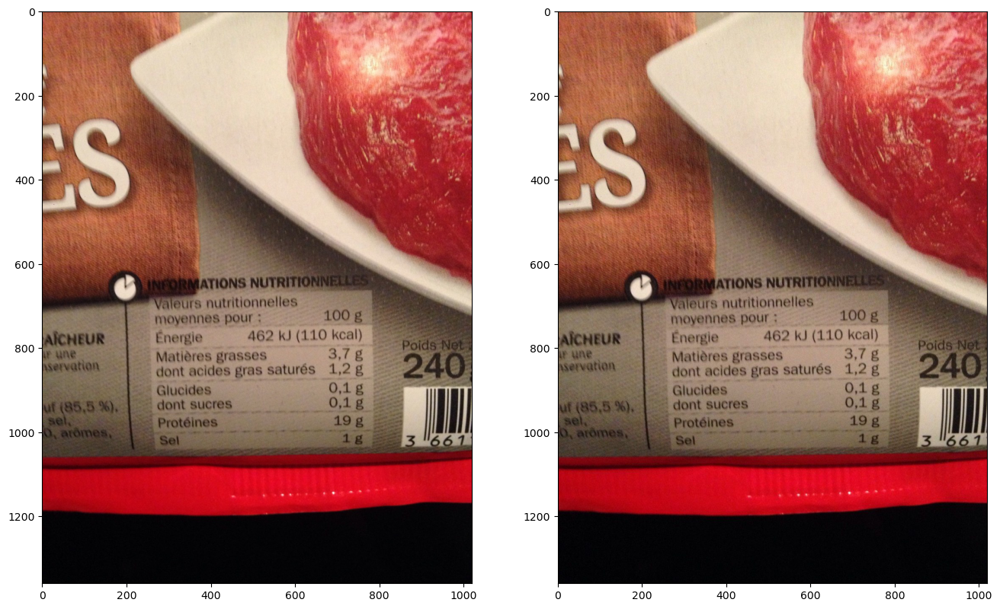

{'sodium': 0.4, 'nova-group_100g': 4, 'fat_value': 3.7, 'energy_serving': 554, 'sugars_value': 0.1, 'sugars_serving': 0.12, 'salt_value': 1, 'salt_unit': 'g', 'sodium_100g': 0.4, 'sodium_value': 0.4, 'sugars': 0.1, 'proteins': 19, 'salt_serving': 1.2, 'sodium_unit': 'g', 'saturated-fat_100g': 1.2, 'carbohydrates_value': 0.1, 'salt_100g': 1, 'carbon-footprint-from-known-ingredients_product': 7350, 'fat': 3.7, 'proteins_100g': 19, 'carbon-footprint-from-known-ingredients_serving': 3670, 'carbon-footprint-from-meat-or-fish_100g': 3060.9, 'energy': 462, 'saturated-fat': 1.2, 'sugars_unit': 'g', 'energy_100g': 462, 'energy_unit': 'kJ', 'sugars_100g': 0.1, 'carbon-footprint-from-meat-or-fish_product': 7350, 'sodium_serving': 0.48, 'saturated-fat_unit': '', 'carbohydrates': 0.1, 'energy_value': 462, 'saturated-fat_serving': 1.44, 'nova-group': 4, 'proteins_unit': '', 'proteins_value': 19, 'saturated-fat_value': 1.2, 'carbon-footprint-from-meat-or-fish_serving': 3670, 'fat_100g': 3.7, 'carbohy

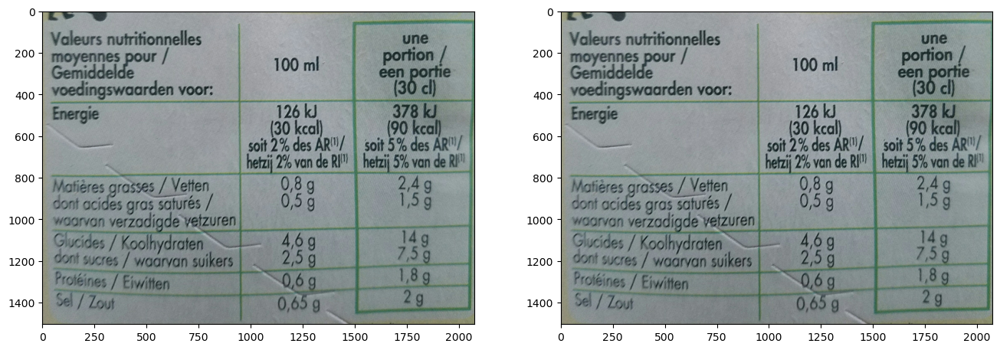

{'nova-group_100g': 4, 'fat_value': 0.825, 'nutrition-score-fr': 8, 'sodium': 0.2568, 'sugars_value': 2.289, 'salt_value': 0.642, 'sugars_serving': 6.87, 'energy_serving': 393, 'fiber_value': 1, 'sodium_100g': 0.2568, 'salt_unit': 'g', 'sodium_value': 0.2568, 'sugars': 2.289, 'salt_serving': 1.93, 'sodium_unit': 'g', 'fiber_unit': 'g', 'proteins': 0.573, 'carbohydrates_value': 4.863, 'saturated-fat_100g': 0.475, 'carbon-footprint-from-known-ingredients_product': 243, 'fat': 0.825, 'salt_100g': 0.642, 'nutrition-score-uk_serving': 1, 'nutrition-score-fr_100g': 8, 'proteins_100g': 0.573, 'carbon-footprint-from-known-ingredients_serving': 121, 'saturated-fat': 0.475, 'nutrition-score-uk': 1, 'fiber': 1, 'energy': 130.913, 'sugars_unit': 'g', 'energy_100g': 130.913, 'sugars_100g': 2.289, 'nutrition-score-uk_100g': 1, 'energy_unit': 'kJ', 'saturated-fat_unit': 'g', 'carbohydrates': 4.863, 'sodium_serving': 0.77, 'saturated-fat_serving': 1.43, 'nova-group': 4, 'proteins_unit': 'g', 'fiber_se

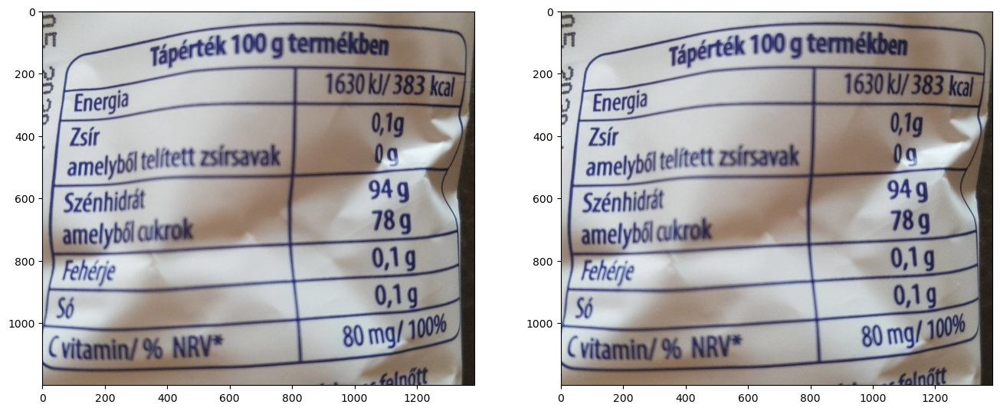

{'saturated-fat_100g': 0, 'carbohydrates_value': 94, 'proteins': 0.1, 'sodium_unit': 'g', 'proteins_100g': 0.1, 'salt_100g': 0.1, 'fat': 0.1, 'salt_value': 0.1, 'sugars_value': 78, 'sodium': 0.04, 'fat_value': 0.1, 'sugars': 78, 'sodium_value': 0.04, 'salt_unit': 'g', 'sodium_100g': 0.04, 'saturated-fat_value': 0, 'proteins_value': 0.1, 'energy_value': 348, 'proteins_unit': 'g', 'salt': 0.1, 'carbohydrates_100g': 94, 'fat_100g': 0.1, 'carbohydrates_unit': 'g', 'fat_unit': 'g', 'energy_100g': 1456, 'sugars_unit': 'g', 'energy': 1456, 'saturated-fat': 0, 'carbohydrates': 94, 'saturated-fat_unit': 'g', 'energy_unit': 'kcal', 'sugars_100g': 78}
--------------------------------------------------
****************************************************************************************************
image id: 3560070513208


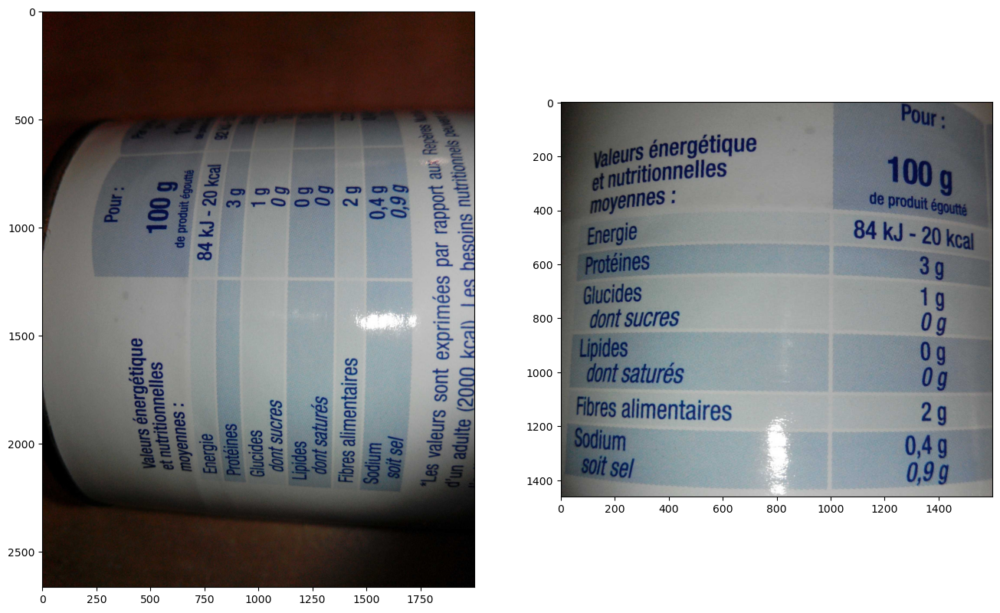

{'proteins_serving': 2.2, 'salt': 0.85, 'fiber_100g': 1.5, 'fat_serving': 0, 'nova-group_serving': 3, 'fruits-vegetables-nuts-dried': 85, 'fat_100g': 0, 'carbohydrates_unit': 'g', 'carbohydrates_100g': 4, 'carbohydrates_serving': 4.4, 'nutrition-score-fr_serving': -4, 'fat_unit': 'g', 'proteins_value': 2, 'saturated-fat_value': 0, 'fiber_serving': 1.65, 'fruits-vegetables-nuts-dried_serving': 85, 'energy_value': 114, 'saturated-fat_serving': 0, 'nova-group': 3, 'proteins_unit': 'g', 'sodium_serving': 0.374, 'saturated-fat_unit': 'g', 'carbohydrates': 4, 'energy_unit': 'kJ', 'sugars_100g': 1.5, 'nutrition-score-uk_100g': -4, 'fruits-vegetables-nuts-dried_unit': 'g', 'sugars_unit': 'g', 'energy_100g': 114, 'energy': 114, 'fiber': 1.5, 'saturated-fat': 0, 'nutrition-score-uk': -4, 'nutrition-score-uk_serving': -4, 'nutrition-score-fr_100g': -4, 'proteins_100g': 2, 'salt_100g': 0.85, 'fat': 0, 'saturated-fat_100g': 0, 'carbohydrates_value': 4, 'proteins': 2, 'fiber_unit': 'g', 'salt_servin

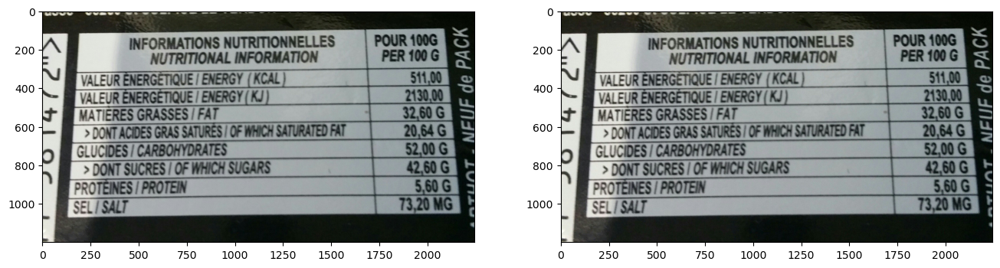

{'proteins_100g': 5.6, 'nutrition-score-fr_100g': 25, 'nutrition-score-uk_serving': 25, 'salt_100g': 0.0732, 'fat': 32.6, 'saturated-fat_100g': 20.64, 'carbohydrates_value': 52, 'proteins': 5.6, 'sodium_unit': 'mg', 'sugars': 42.6, 'sodium_value': 29.28, 'salt_unit': 'mg', 'sodium_100g': 0.02928, 'salt_value': 73.2, 'sugars_value': 42.6, 'sodium': 0.02928, 'fat_value': 32.6, 'nutrition-score-fr': 25, 'salt': 0.0732, 'carbohydrates_100g': 52, 'fat_100g': 32.6, 'carbohydrates_unit': 'g', 'fat_unit': 'g', 'nutrition-score-fr_serving': 25, 'saturated-fat_value': 20.64, 'proteins_value': 5.6, 'energy_value': 511, 'proteins_unit': 'g', 'carbohydrates': 52, 'saturated-fat_unit': 'g', 'energy_unit': 'kcal', 'sugars_100g': 42.6, 'nutrition-score-uk_100g': 25, 'energy_100g': 2138, 'sugars_unit': 'g', 'energy': 2138, 'nutrition-score-uk': 25, 'saturated-fat': 20.64}
--------------------------------------------------
*********************************************************************************

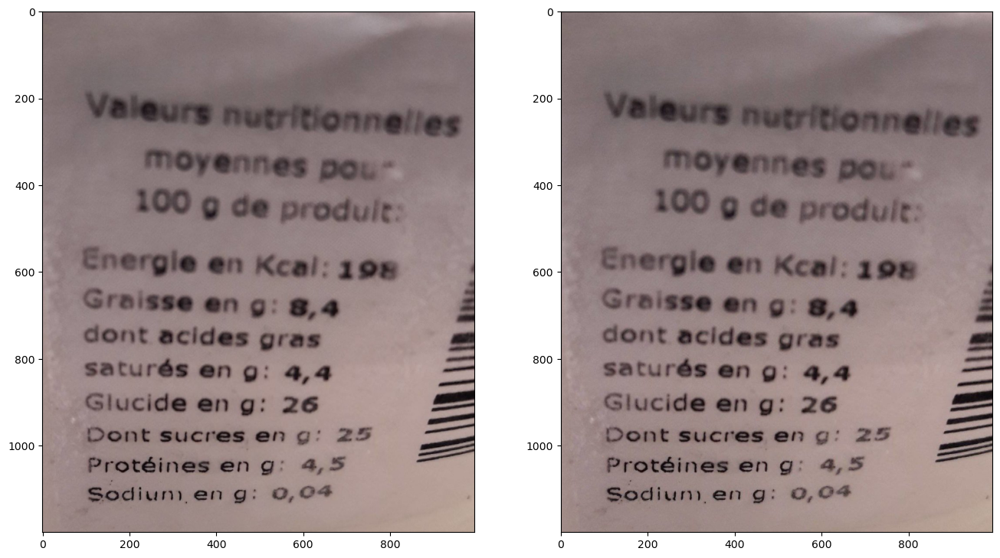

{'energy': 828, 'saturated-fat': 4.4, 'sugars_unit': '', 'energy_100g': 828, 'energy_unit': 'kcal', 'sugars_100g': 25, 'carbohydrates': 26, 'saturated-fat_unit': '', 'energy_value': 198, 'proteins_unit': '', 'proteins_value': 4.5, 'saturated-fat_value': 4.4, 'carbohydrates_unit': '', 'fat_100g': 8.4, 'carbohydrates_100g': 26, 'fat_unit': '', 'salt': 0.04, 'sodium': 0.016, 'fat_value': 8.4, 'sugars_value': 25, 'salt_value': 0.04, 'salt_unit': '', 'sodium_100g': 0.016, 'sodium_value': 0.016, 'sugars': 25, 'proteins': 4.5, 'sodium_unit': 'g', 'saturated-fat_100g': 4.4, 'carbohydrates_value': 26, 'salt_100g': 0.04, 'fat': 8.4, 'proteins_100g': 4.5}
--------------------------------------------------
****************************************************************************************************
image id: 0096619381777


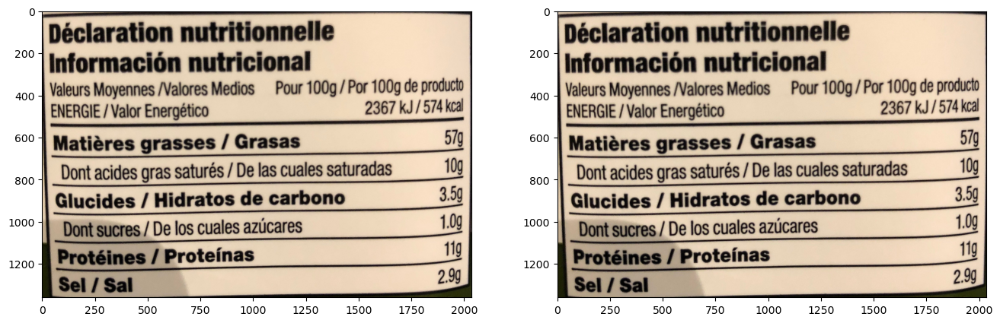

{'salt_100g': 2.9, 'fat': 57, 'nutrition-score-fr_100g': 26, 'nutrition-score-uk_serving': 26, 'proteins_100g': 11, 'proteins': 11, 'sodium_unit': 'g', 'saturated-fat_100g': 10, 'carbohydrates_value': 3.5, 'salt_unit': '', 'sodium_100g': 1.16, 'sodium_value': 1.16, 'sugars': 1, 'sodium': 1.16, 'fat_value': 57, 'nova-group_100g': 3, 'nutrition-score-fr': 26, 'sugars_value': 1, 'salt_value': 2.9, 'carbohydrates_unit': '', 'fat_100g': 57, 'carbohydrates_100g': 3.5, 'carbon-footprint-from-known-ingredients_100g': 0.69, 'nutrition-score-fr_serving': 26, 'fat_unit': '', 'salt': 2.9, 'nova-group_serving': 3, 'energy_value': 574, 'nova-group': 3, 'proteins_unit': '', 'proteins_value': 11, 'saturated-fat_value': 10, 'energy_unit': 'kcal', 'sugars_100g': 1, 'nutrition-score-uk_100g': 26, 'saturated-fat_unit': '', 'carbohydrates': 3.5, 'energy': 2402, 'saturated-fat': 10, 'nutrition-score-uk': 26, 'sugars_unit': '', 'energy_100g': 2402}
--------------------------------------------------
*********

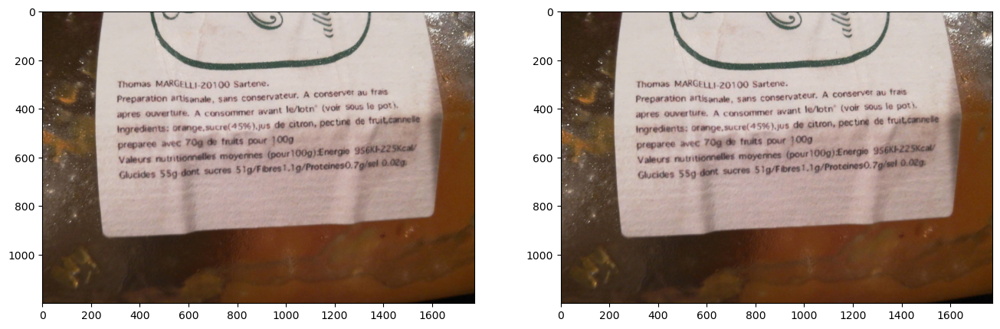

{'saturated-fat_100g': 0.1, 'carbohydrates_value': 55, 'proteins': 0.7, 'sodium_unit': 'g', 'proteins_100g': 0.7, 'salt_100g': 0.02, 'fat': 0.1, 'sugars_value': 51, 'salt_value': 0.02, 'sodium': 0.008, 'fat_value': 0.1, 'sodium_value': 0.008, 'sugars': 51, 'salt_unit': '', 'sodium_100g': 0.008, 'proteins_value': 0.7, 'saturated-fat_value': 0.1, 'energy_value': 225, 'proteins_unit': '', 'salt': 0.02, 'fat_100g': 0.1, 'carbohydrates_unit': '', 'carbohydrates_100g': 55, 'fat_unit': '', 'sugars_unit': '', 'energy_100g': 941, 'energy': 941, 'saturated-fat': 0.1, 'carbohydrates': 55, 'saturated-fat_unit': '', 'energy_unit': 'kcal', 'sugars_100g': 51}
--------------------------------------------------
****************************************************************************************************
image id: 2434432025320


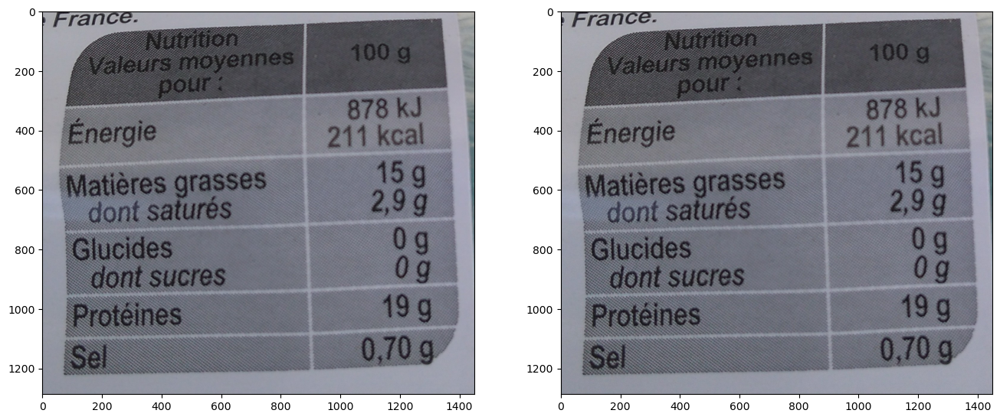

{'sugars': 0, 'sodium_value': 0.28, 'alcohol_unit': '% vol', 'sodium_100g': 0.28, 'salt_unit': '', 'salt_value': 0.7, 'sugars_value': 0, 'fat_value': 15, 'sodium': 0.28, 'carbon-footprint-from-meat-or-fish_100g': 2935.6, 'proteins_100g': 19, 'fat': 15, 'carbon-footprint-from-known-ingredients_product': 6.79, 'salt_100g': 0.7, 'alcohol_serving': 0, 'carbohydrates_value': 0, 'saturated-fat_100g': 2.9, 'sodium_unit': 'g', 'proteins': 19, 'carbohydrates': 0, 'saturated-fat_unit': '', 'carbon-footprint-from-meat-or-fish_product': 6.75, 'sugars_100g': 0, 'energy_unit': 'kcal', 'energy_100g': 883, 'sugars_unit': '', 'saturated-fat': 2.9, 'energy': 883, 'alcohol_value': 0, 'salt': 0.7, 'alcohol': 0, 'fat_unit': '', 'carbohydrates_100g': 0, 'carbon-footprint-from-known-ingredients_100g': 2950.031, 'carbohydrates_unit': '', 'fat_100g': 15, 'saturated-fat_value': 2.9, 'alcohol_100g': 0, 'proteins_value': 19, 'proteins_unit': '', 'energy_value': 211}
-----------------------------------------------

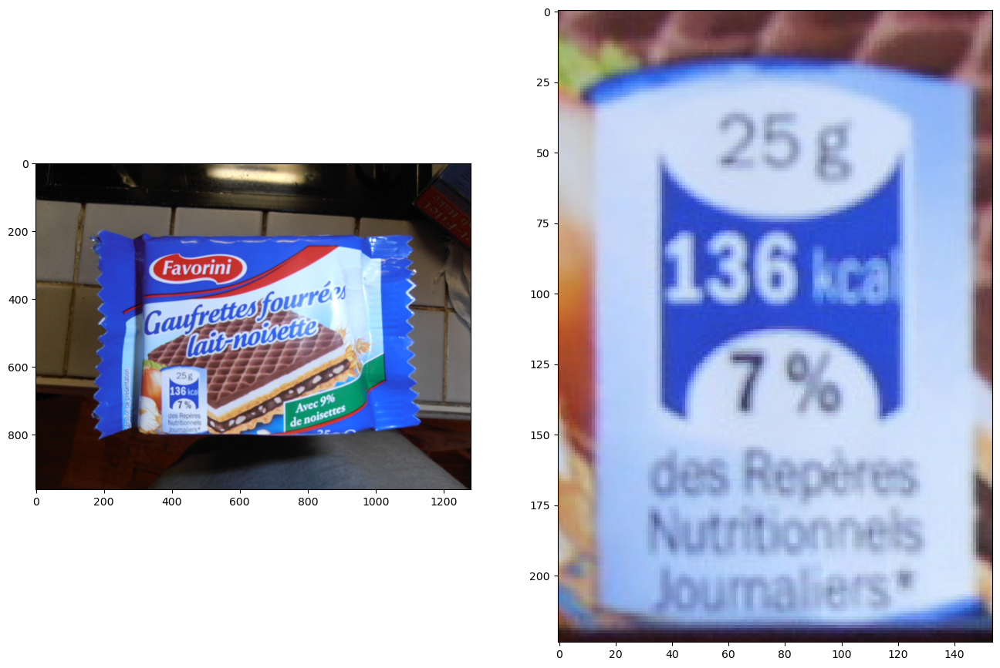

{'salt': 0.3, 'proteins_serving': 1.98, 'nova-group_serving': 4, 'fat_serving': 7.85, 'carbohydrates_100g': 52.9, 'carbohydrates_unit': 'g', 'fat_100g': 31.4, 'fat_unit': 'g', 'nutrition-score-fr_serving': 24, 'carbohydrates_serving': 13.2, 'saturated-fat_value': 22.4, 'proteins_value': 7.9, 'energy_value': 532, 'proteins_unit': 'g', 'saturated-fat_serving': 5.6, 'nova-group': 4, 'sodium_serving': 0.03, 'saturated-fat_unit': 'g', 'carbohydrates': 52.9, 'energy_unit': 'kcal', 'sugars_100g': 34.3, 'nutrition-score-uk_100g': 24, 'energy_100g': 2226, 'sugars_unit': 'g', 'energy': 2226, 'nutrition-score-uk': 24, 'saturated-fat': 22.4, 'nutrition-score-uk_serving': 24, 'proteins_100g': 7.9, 'nutrition-score-fr_100g': 24, 'salt_100g': 0.3, 'fat': 31.4, 'saturated-fat_100g': 22.4, 'carbohydrates_value': 52.9, 'proteins': 7.9, 'sodium_unit': 'g', 'salt_serving': 0.075, 'sugars': 34.3, 'sodium_value': 0.12, 'salt_unit': 'g', 'sodium_100g': 0.12, 'energy_serving': 556, 'salt_value': 0.3, 'sugars_

In [9]:
total_displayed_images = 0

for img_id in ids[:10]:
    try:
        explore_image(img_id, base_path)
        total_displayed_images += 1
    except:
        continue
        
print("Total displayed images: %d" %total_displayed_images)

In [10]:
import easyocr
import pandas as pd
reader = easyocr.Reader(['fr' ], gpu=False)

Using CPU. Note: This module is much faster with a GPU.


Progress: |██████████████████████████████████████████████████| 100.0% Complete

image id: 3661112086206


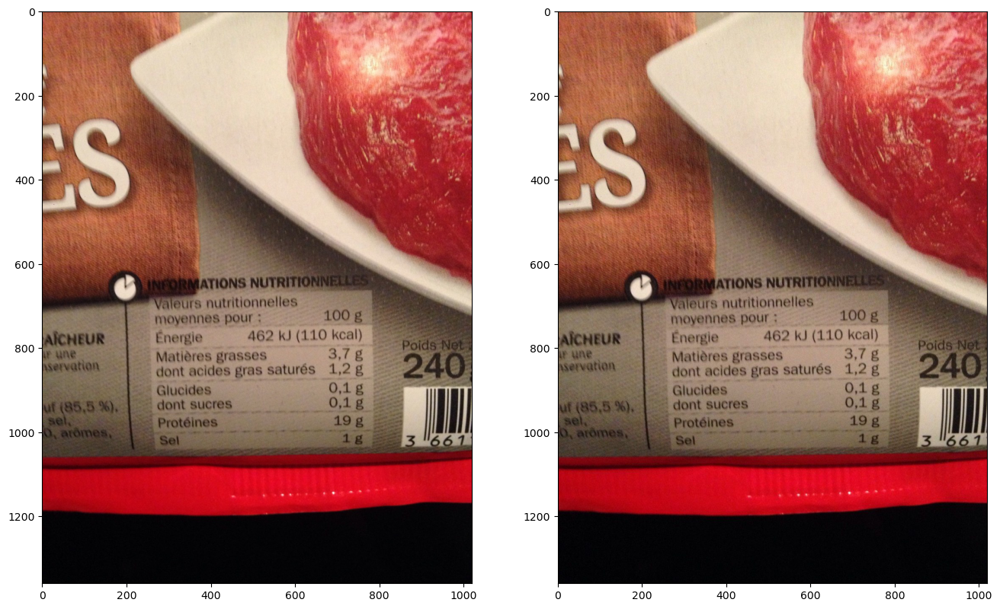

{'sodium': 0.4, 'nova-group_100g': 4, 'fat_value': 3.7, 'energy_serving': 554, 'sugars_value': 0.1, 'sugars_serving': 0.12, 'salt_value': 1, 'salt_unit': 'g', 'sodium_100g': 0.4, 'sodium_value': 0.4, 'sugars': 0.1, 'proteins': 19, 'salt_serving': 1.2, 'sodium_unit': 'g', 'saturated-fat_100g': 1.2, 'carbohydrates_value': 0.1, 'salt_100g': 1, 'carbon-footprint-from-known-ingredients_product': 7350, 'fat': 3.7, 'proteins_100g': 19, 'carbon-footprint-from-known-ingredients_serving': 3670, 'carbon-footprint-from-meat-or-fish_100g': 3060.9, 'energy': 462, 'saturated-fat': 1.2, 'sugars_unit': 'g', 'energy_100g': 462, 'energy_unit': 'kJ', 'sugars_100g': 0.1, 'carbon-footprint-from-meat-or-fish_product': 7350, 'sodium_serving': 0.48, 'saturated-fat_unit': '', 'carbohydrates': 0.1, 'energy_value': 462, 'saturated-fat_serving': 1.44, 'nova-group': 4, 'proteins_unit': '', 'proteins_value': 19, 'saturated-fat_value': 1.2, 'carbon-footprint-from-meat-or-fish_serving': 3670, 'fat_100g': 3.7, 'carbohy

In [11]:
# set one id
img_id = ids[0]

# get all the data
img, cropped_img, json_file_path, cropped_json_file_path = get_file_paths(img_id, base_path)

# print image
explore_image(img_id, base_path)

easy_ocr_result = reader.readtext(cropped_img, detail=0)
print(easy_ocr_result)

In [51]:
import json
def has_number(input_string):
    for char in input_string:
        if char.isdigit():
            return True
    return False
def format_ocr_results(ocr_results):
    result_dict = {}
    current_key = None

    for item in ocr_results:
        if has_number(item):
            if current_key is not None:
                result_dict[current_key] = item
                current_key = None
        else:
            if current_key is not None:
                current_key += " " + item
            else:
                current_key = item

    return result_dict

# Sample OCR results list


# Formatting OCR results into JSON key-value format
formatted_data = format_ocr_results(easy_ocr_result)

# Print the formatted JSON
# display json as table
df_easy_ocr = pd.DataFrame.from_dict(formatted_data, orient='index').reset_index()
df_easy_ocr.columns = ['key', 'value']
df_easy_ocr.head(10)



,key,value
0,{MFoRMaTiOns NUTRITIONNELLES Valeurs nutrition...,100 g
1,moyennes,486 kJ (116 kcal)
2,Énergie,"4,49"
3,Matières grasses,"0,49"
4,dont acides grus soturés,"71,8 9"
5,Glucides,"2,69"
6,dont sucres,"1,39"
7,Fibres alimentaires Protéines,"6,69"
8,Sel,9
9,pour,"1,50"


In [54]:
nutrition_json = {'sugars': 2.5, 'sodium_value': 0.68, 'salt_unit': 'g', 'fiber_value': 1, 'sodium_100g': 0.68, 'energy_serving': 437, 'salt_value': 1.7, 'sugars_serving': 2.25, 'sugars_value': 2.5, 'sodium': 0.68, 'nutrition-score-fr': 3, 'fat_value': 4.2, 'nova-group_100g': 4, 'carbon-footprint-from-known-ingredients_serving': 393, 'nutrition-score-fr_100g': 3, 'nutrition-score-uk_serving': 3, 'proteins_100g': 7, 'salt_100g': 1.7, 'fat': 4.2, 'carbon-footprint-from-known-ingredients_product': 787, 'saturated-fat_100g': 0.4, 'carbohydrates_value': 12, 'proteins': 7, 'fiber_unit': 'g', 'sodium_unit': 'g', 'salt_serving': 1.53, 'sodium_serving': 0.612, 'saturated-fat_unit': 'g', 'carbohydrates': 12, 'energy_unit': 'kJ', 'sugars_100g': 2.5, 'nutrition-score-uk_100g': 3, 'energy_100g': 486, 'sugars_unit': 'g', 'energy': 486, 'fiber': 1, 'nutrition-score-uk': 3, 'saturated-fat': 0.4, 'fiber_100g': 1, 'salt': 1.7, 'proteins_serving': 6.3, 'nova-group_serving': 4, 'fat_serving': 3.78, 'carbohydrates_100g': 12, 'carbon-footprint-from-known-ingredients_100g': 437, 'fat_100g': 4.2, 'carbohydrates_unit': 'g', 'fat_unit': 'g', 'nutrition-score-fr_serving': 3, 'carbohydrates_serving': 10.8, 'saturated-fat_value': 0.4, 'proteins_value': 7, 'energy_value': 486, 'fiber_serving': 0.9, 'proteins_unit': 'g', 'nova-group': 4, 'saturated-fat_serving': 0.36}
# display json as table
df_nutrition = pd.DataFrame.from_dict(nutrition_json, orient='index').reset_index()
df_nutrition.columns = ['key_baseline', 'value_baseline']
df_nutrition.head(10)

,key_baseline,value_baseline
0,sugars,2.5
1,sodium_value,0.68
2,salt_unit,g
3,fiber_value,1
4,sodium_100g,0.68
5,energy_serving,437
6,salt_value,1.7
7,sugars_serving,2.25
8,sugars_value,2.5
9,sodium,0.68


In [55]:
# Print rows of df_nutrition and df_easy_ocr in one dataframe
comparison_df = pd.concat([df_nutrition, df_easy_ocr], axis=1)
comparison_df

,key_baseline,value_baseline,key,value
0,sugars,2.5,{MFoRMaTiOns NUTRITIONNELLES Valeurs nutrition...,100 g
1,sodium_value,0.68,moyennes,486 kJ (116 kcal)
2,salt_unit,g,Énergie,"4,49"
3,fiber_value,1,Matières grasses,"0,49"
4,sodium_100g,0.68,dont acides grus soturés,"71,8 9"
5,energy_serving,437,Glucides,"2,69"
6,salt_value,1.7,dont sucres,"1,39"
7,sugars_serving,2.25,Fibres alimentaires Protéines,"6,69"
8,sugars_value,2.5,Sel,9
9,sodium,0.68,pour,"1,50"
